In [1]:
%load_ext autoreload
%autoreload 2

%load_ext dotenv
%dotenv


In [2]:
import pandas as pd
import logging
import numpy as np
import matplotlib.pyplot as plt
from galaxies import plot_2Dmap, make_sample, detect_scan_from_filename,make_slice
import os
import glob
from galaxies_ava import plot_line_XES, energy_calibration, calibrate_energy_ax,mask_ROI, remove_elastic

logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)

In [3]:
pixel_calibration = np.array([2.02640772e-01, 2.44374424e+03])
roi_left = [70, 100]
roi_right = [285, 315]

# Folder overview

In [4]:
def foo():

    files = sorted(glob.glob(os.path.join(os.environ['DATA_PATH'], 'Electrode*.nxs')))

    data = []
    for filename in files:
        scan_type, scan_command, all_data = detect_scan_from_filename(filename, include_full_data=True)
        time_start = all_data.get('start_time', None)
        number_of_energies = len(all_data.get('energies', []))
        exposure_time = all_data.get('exposure_time', [0])[0]/1000  # Convert from ms to seconds

        data.append((time_start, os.path.basename(filename), scan_type, number_of_energies, exposure_time, scan_command))
    df = pd.DataFrame(data, columns=['start_time', 'filename', 'scan_type', 'ene_steps', 'seconds_per_step', 'scan_command'])

    return df


foo()

,start_time,filename,scan_type,ene_steps,seconds_per_step,scan_command
0,2025-05-28T17:23:31,Electrode_01_0001.nxs,XES one shot,1,0.0,
1,2025-05-28T17:35:09,Electrode_01_0002.nxs,RIXS scan,5,0.0,
2,2025-05-28T17:53:19,Electrode_01_0003.nxs,RIXS scan,0,1.0,
3,2025-05-28T17:55:44,Electrode_01_0004.nxs,RIXS scan,5,1.0,
4,2025-05-28T18:01:18,Electrode_01_0005.nxs,RIXS scan,31,10.0,
...,...,...,...,...,...,...
582,2025-06-02T03:43:27,Electrode_34_0003.nxs,XAS scan,0,0.0,a_stepscan bl_energy 2460 2500 200 1
583,2025-06-02T03:56:06,Electrode_34_0004.nxs,XAS scan,0,0.0,a_stepscan bl_energy 2460 2500 200 1
584,2025-06-02T04:08:10,Electrode_34_0005.nxs,XAS scan,0,0.0,a_stepscan bl_energy 2460 2500 200 1
585,2025-06-02T04:26:07,Electrode_35_0001.nxs,XAS scan,0,0.0,a_stepscan bl_energy 2460 2500 200 1


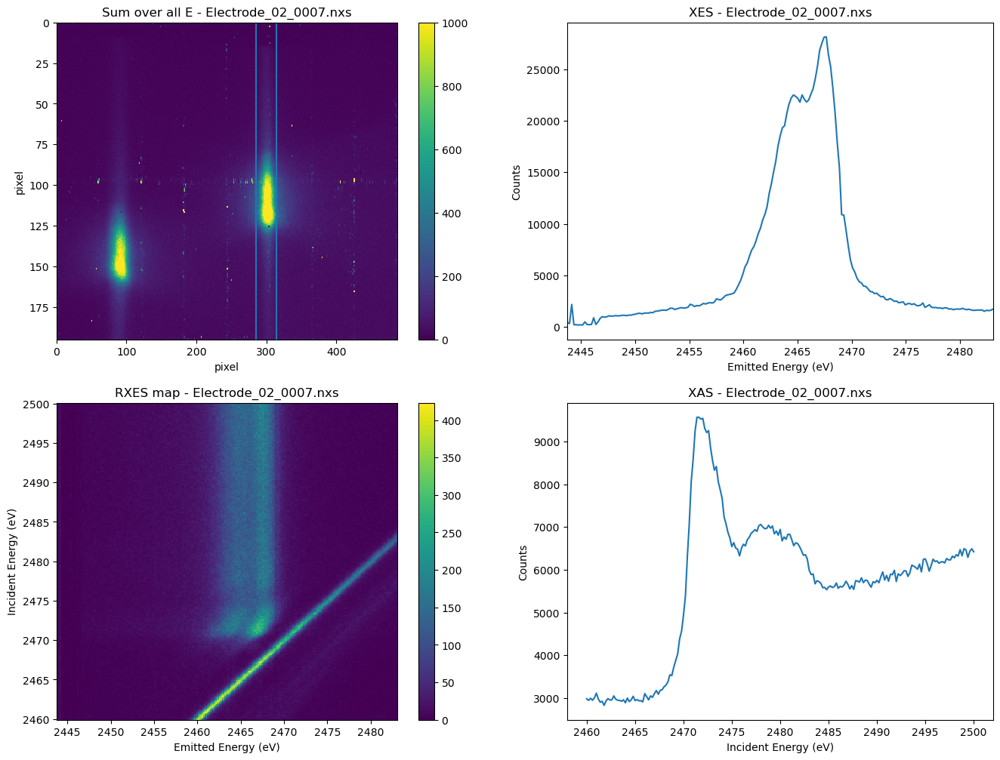

In [8]:

plot_2Dmap('Electrode_02_0007.nxs', pixel_calibration, roi_right, vmax_sum=1000)


In [6]:
_ = make_slice('Electrode_01_0007.nxs', roi_right, pixel_calibration, 2471.9)

In [7]:
make_sample('Electrode_01_0008.nxs', [[220,240]])

In [8]:
plot_2Dmap('Electrode_01_0009.nxs', pixel_calibration, roi_right, vmax_sum=300)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


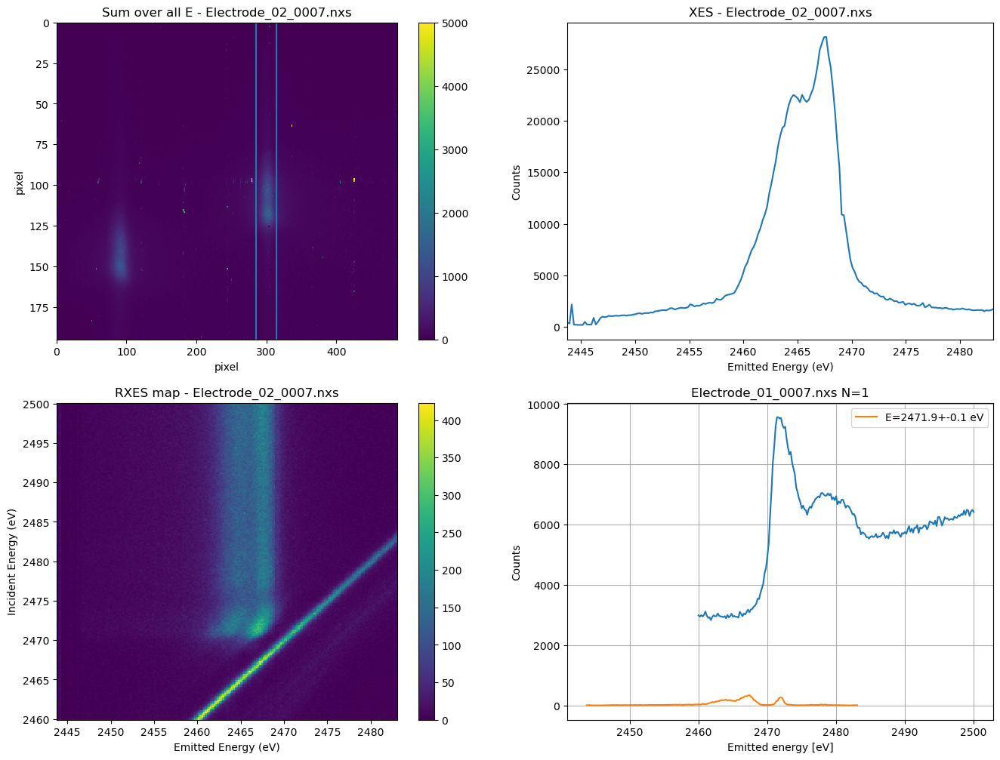

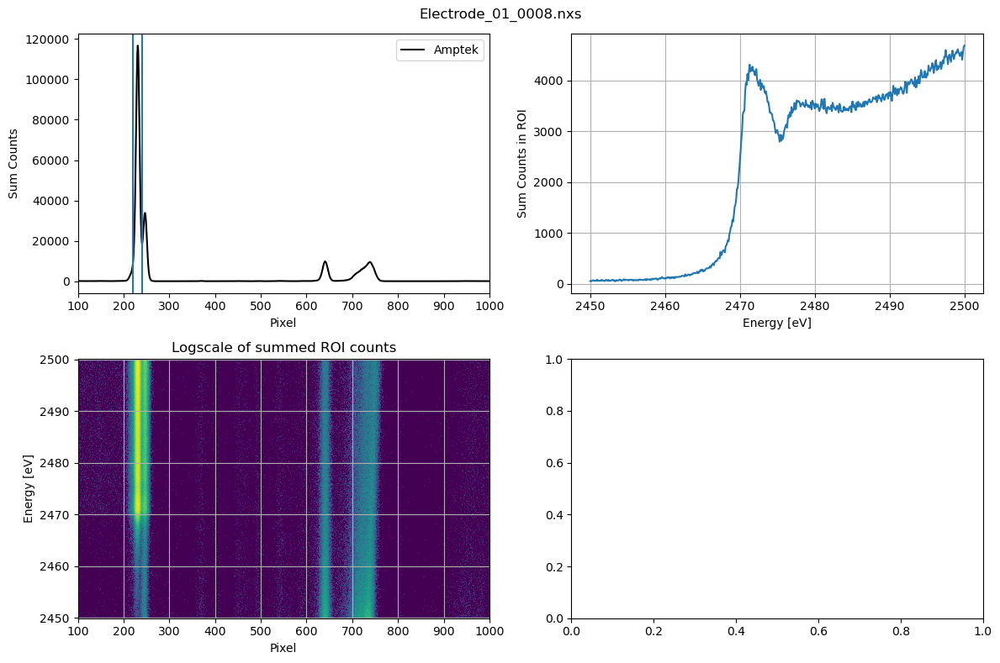

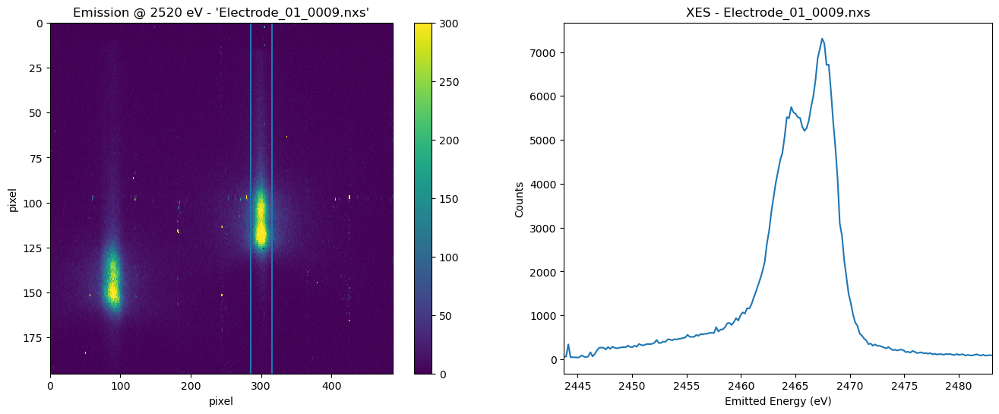

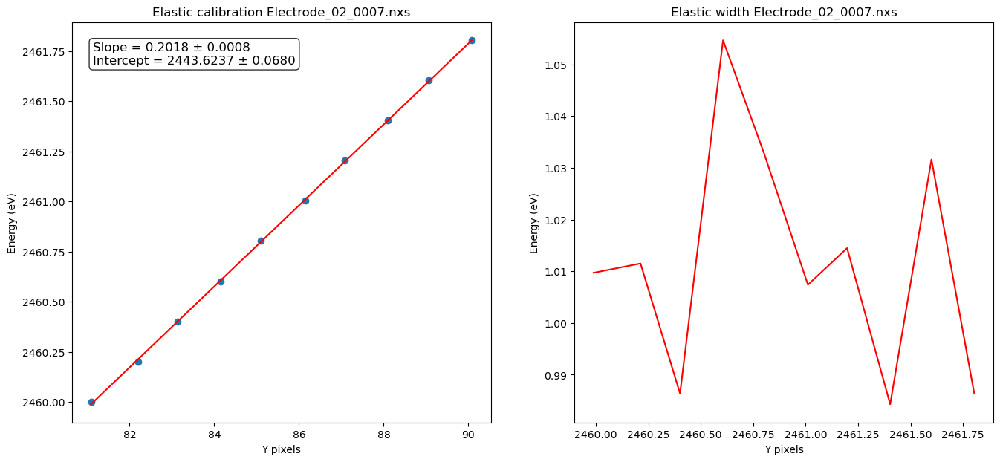

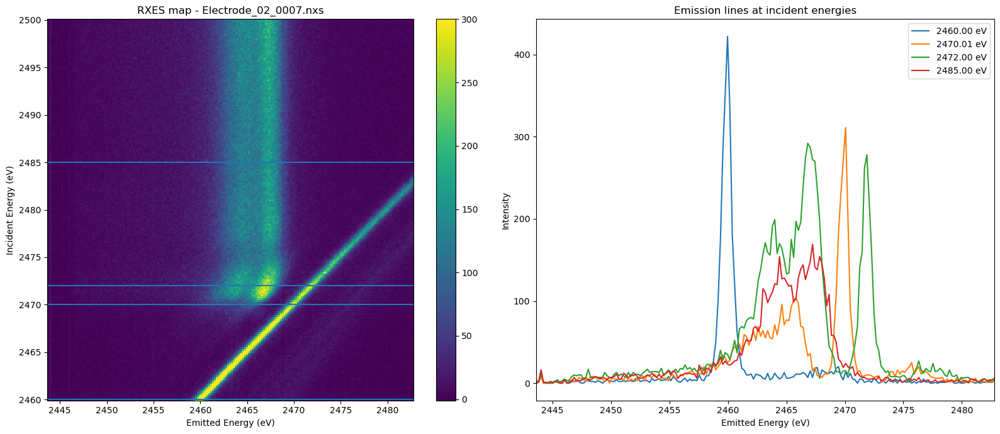

In [9]:
line = energy_calibration('Electrode_02_0007.nxs', roi_right)
plot_line_XES('Electrode_02_0007.nxs', line, roi_right, [2460,2470,2472,2485])

# Electrode 02

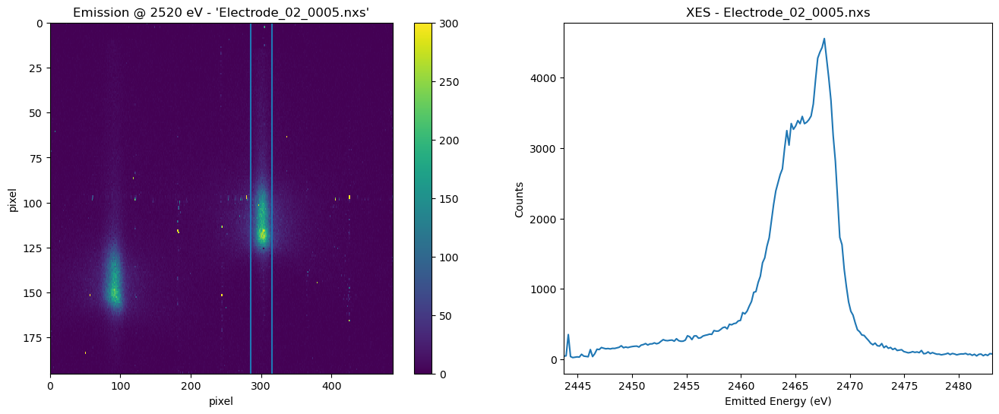

In [10]:
plt.close('all')
plot_2Dmap('Electrode_02_0005.nxs', pixel_calibration, roi_right, vmax_sum=300)
plt.show()

In [11]:
import warnings
warnings.filterwarnings('always')
plot_2Dmap('Electrode_02_0007.nxs', pixel_calibration, roi_right, vmax_sum=1300)

In [12]:
line = energy_calibration('Electrode_02_0007.nxs', roi_right)


/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

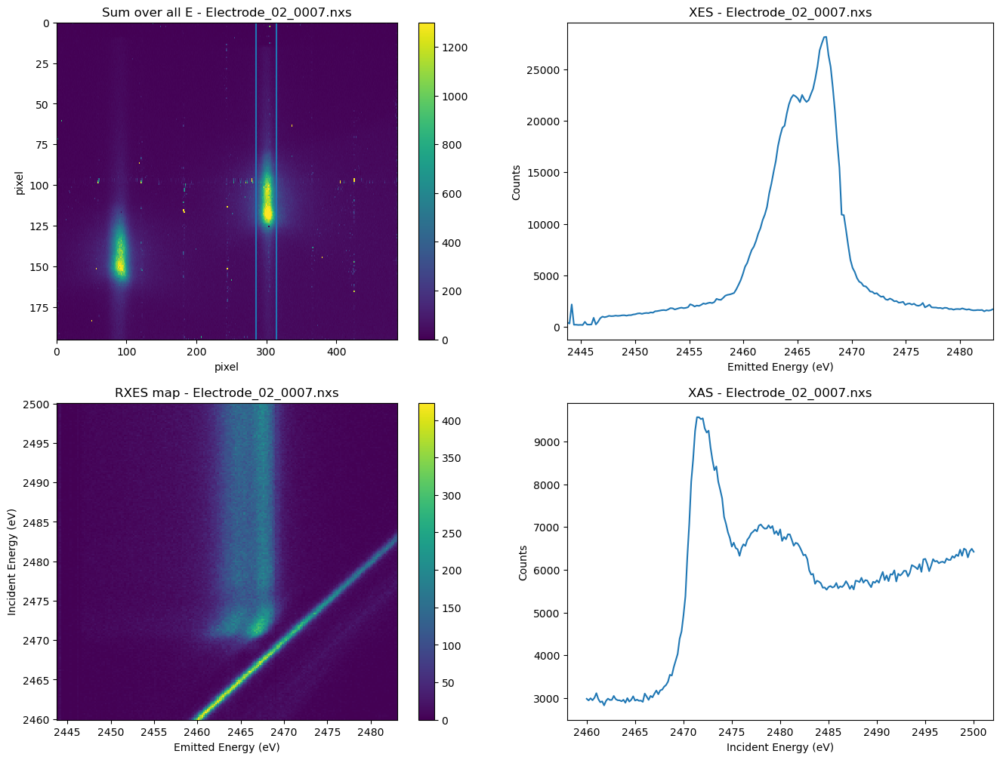

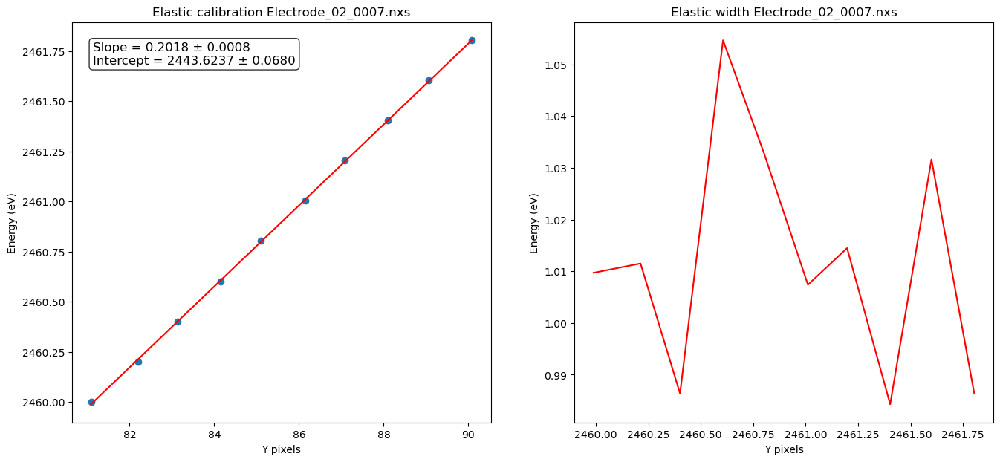

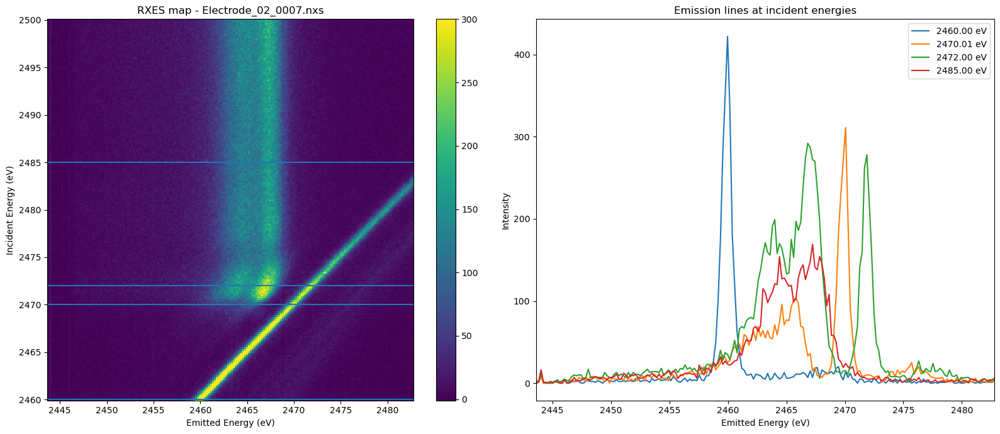

In [13]:
plot_line_XES('Electrode_02_0007.nxs', line, roi_right, [2460,2470,2472,2485])


# Electrode 04

In [14]:
plot_2Dmap('Electrode_04_0005.nxs', pixel_calibration, [290, 320], vmax_sum=300)

In [15]:
make_sample('Electrode_04_0006.nxs', [[220,240]])

In [16]:
make_sample('Electrode_04_0007.nxs', [[220,240]])

In [17]:
plot_2Dmap('Electrode_04_0008.nxs', pixel_calibration, [290, 320], vmax_sum=1300)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

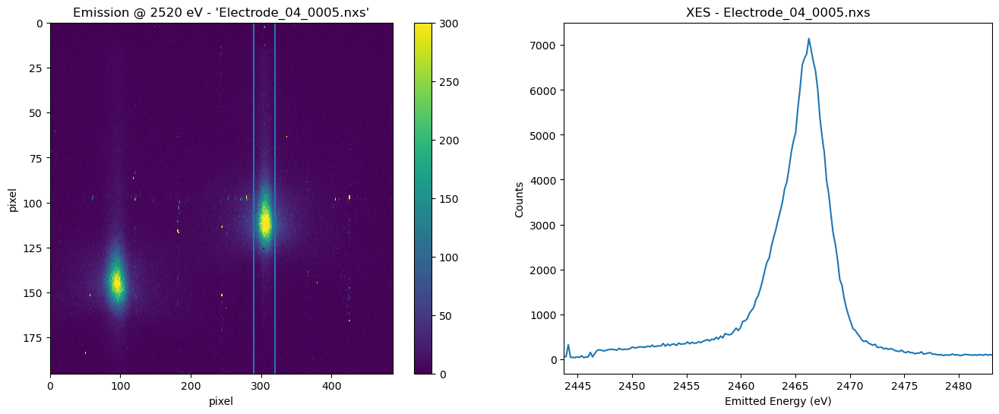

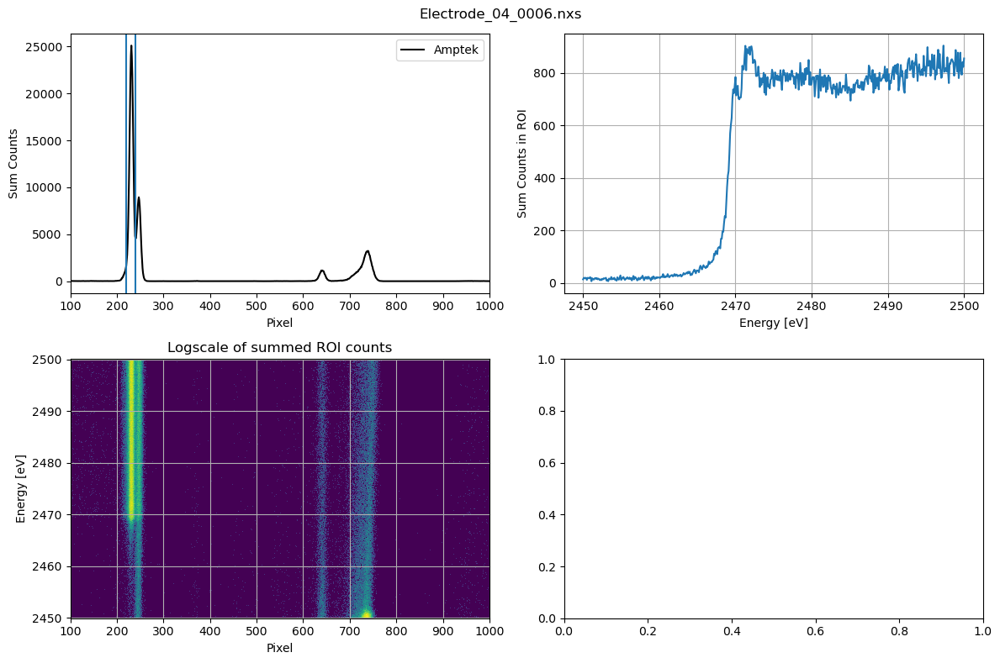

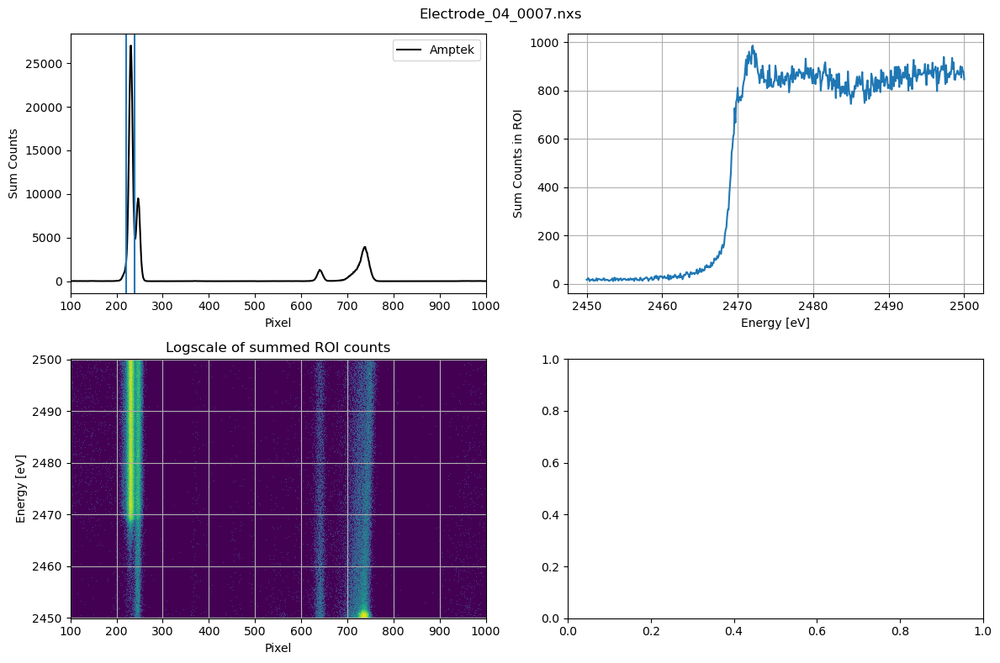

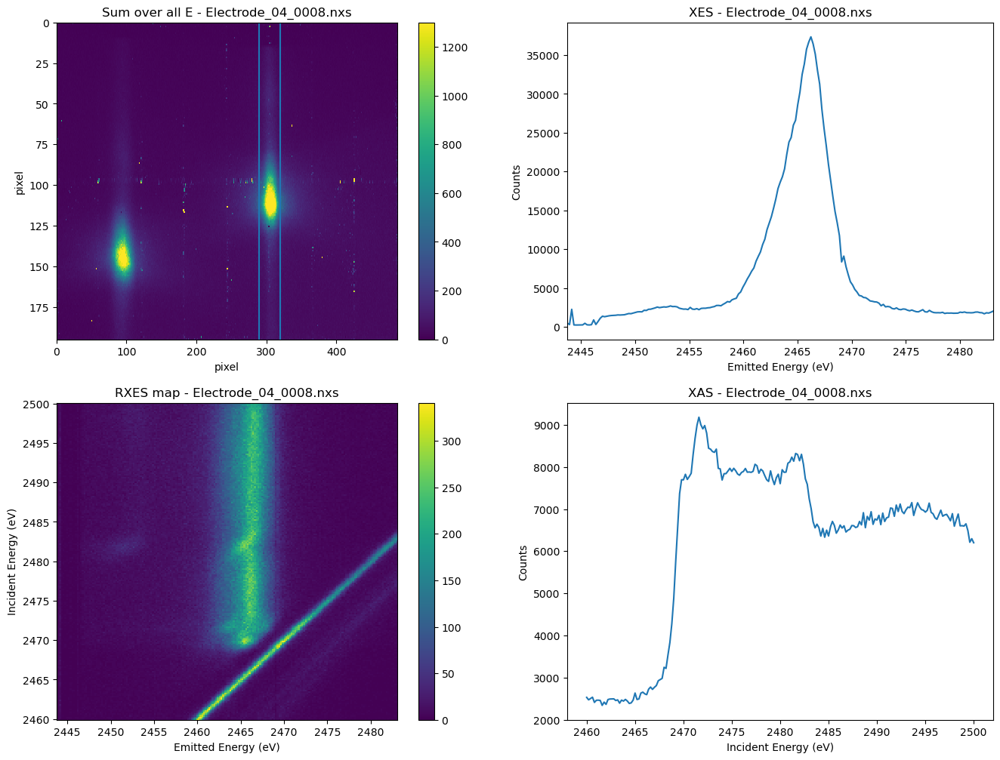

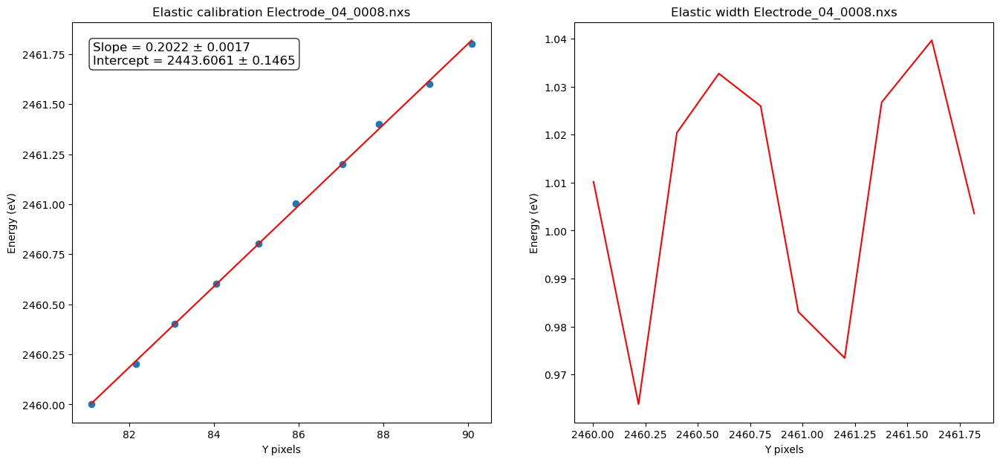

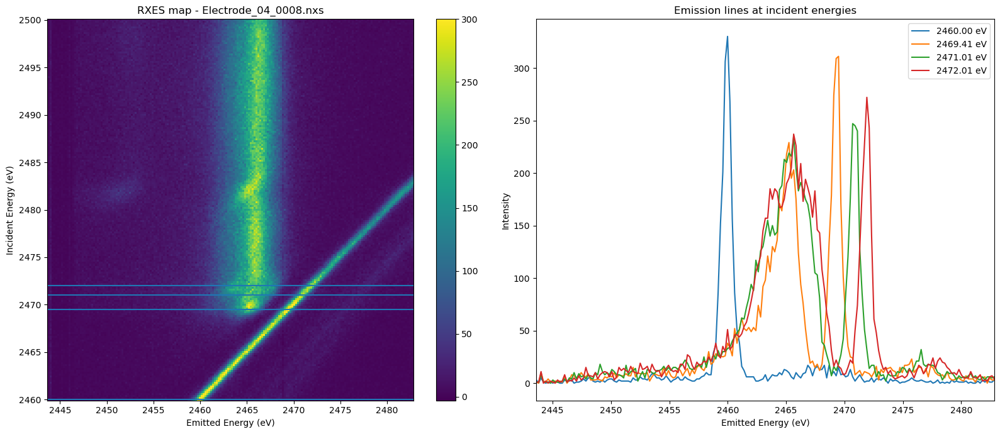

In [18]:
line = energy_calibration('Electrode_04_0008.nxs', [290, 320])
plot_line_XES('Electrode_04_0008.nxs', line, [290, 320], [2460,2469.5,2471,2472], vmax = 300)

# Electrode 05

In [19]:
plot_2Dmap('Electrode_05_0003.nxs', pixel_calibration, [320, 340], vmax_sum=80)

In [20]:
plot_2Dmap('Electrode_05_0004.nxs', pixel_calibration, [315, 345], vmax_sum=6000)

In [21]:
_ = make_slice('Electrode_05_0004.nxs', roi_right, pixel_calibration, 2470)

In [22]:
plot_2Dmap('Electrode_05_0005.nxs', pixel_calibration, [315, 345], vmax_sum=100)

In [23]:
make_sample('Electrode_05_0006.nxs', [[220,240]])

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

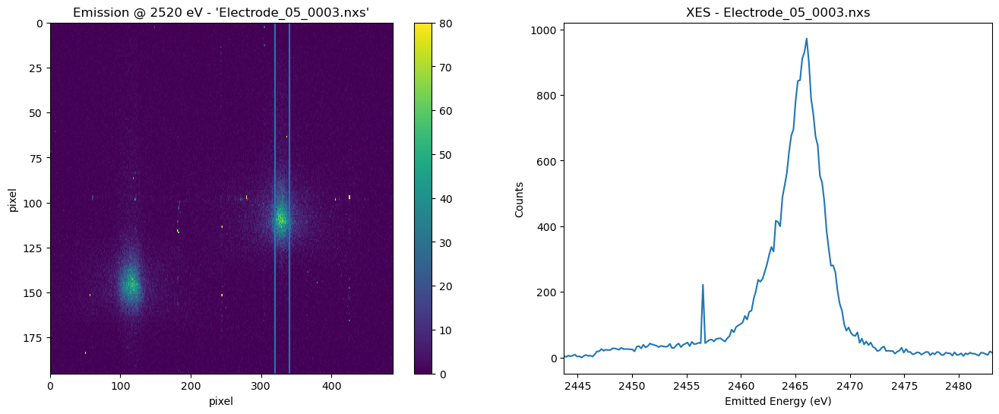

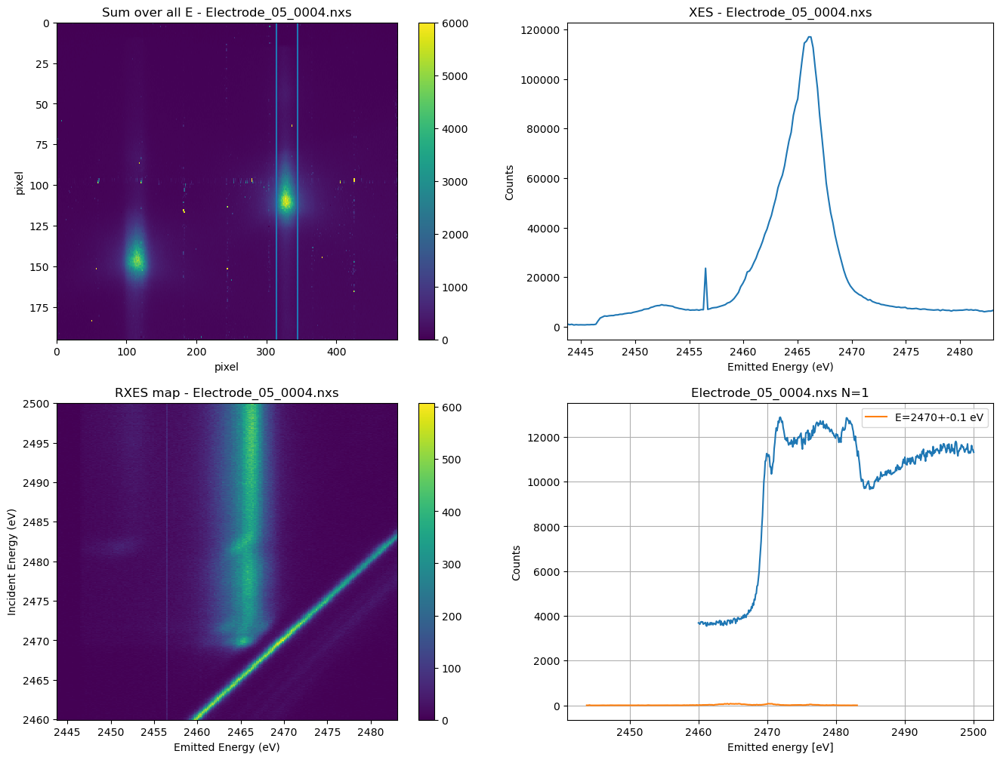

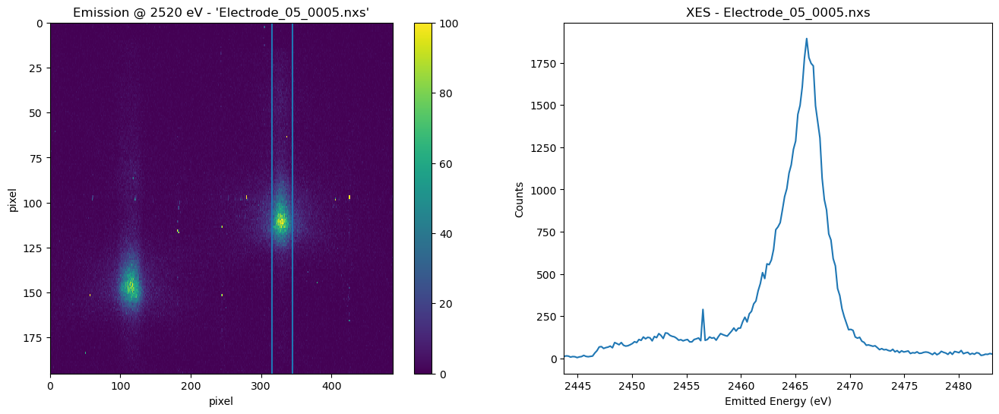

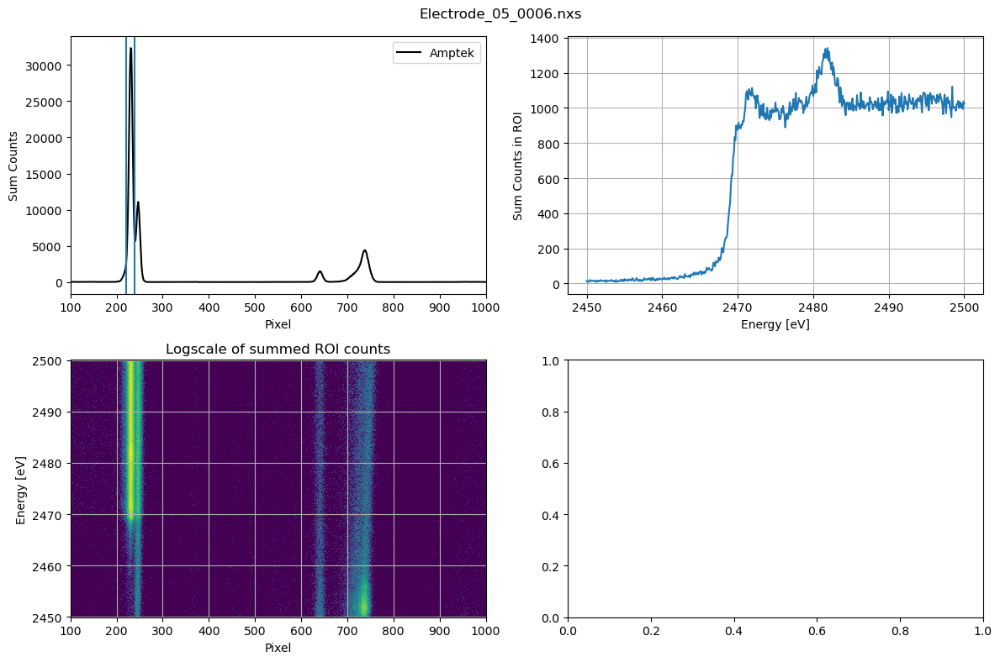

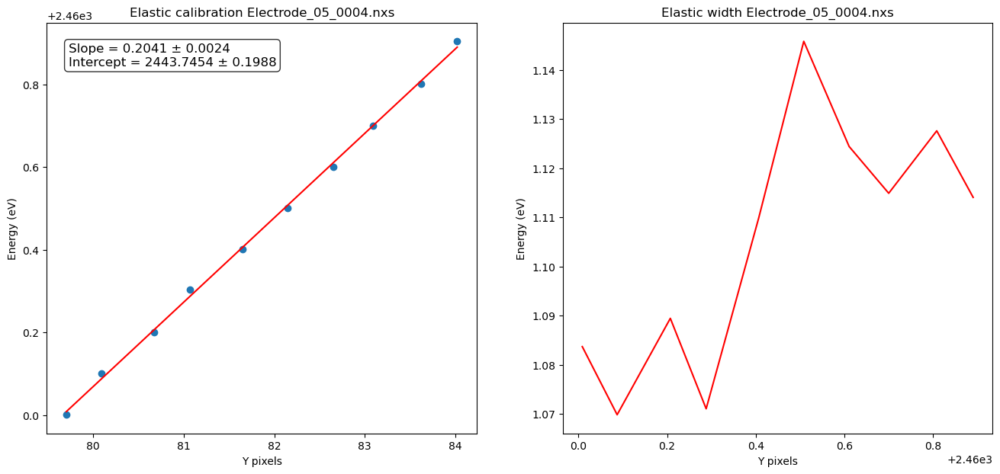

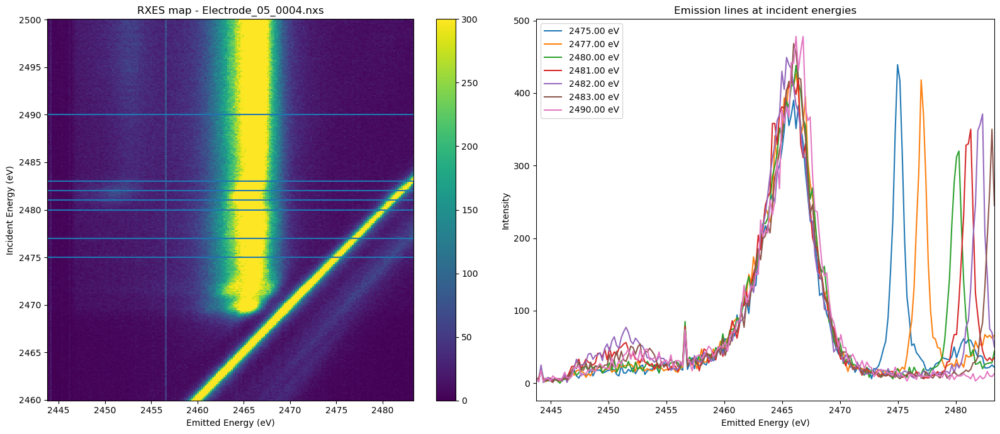

In [24]:
line = energy_calibration('Electrode_05_0004.nxs', [290, 345])
plot_line_XES('Electrode_05_0004.nxs', line, [290, 345], [2475,2477, 2480,2481,2482,2483,2490], vmax = 300)


# Electrode 07

In [25]:
# Electrode 07

In [26]:
plot_2Dmap('Electrode_07_0004.nxs', pixel_calibration, [315, 345], vmax_sum=5000)

In [27]:
line = energy_calibration('Electrode_07_0004.nxs', [315, 345])

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

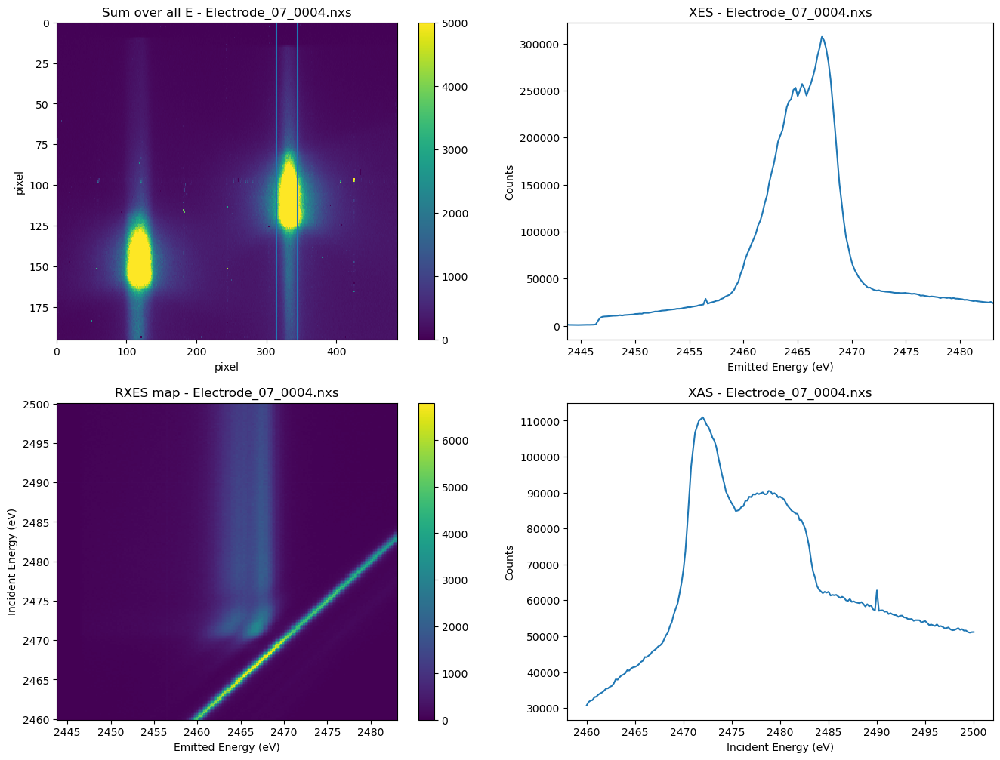

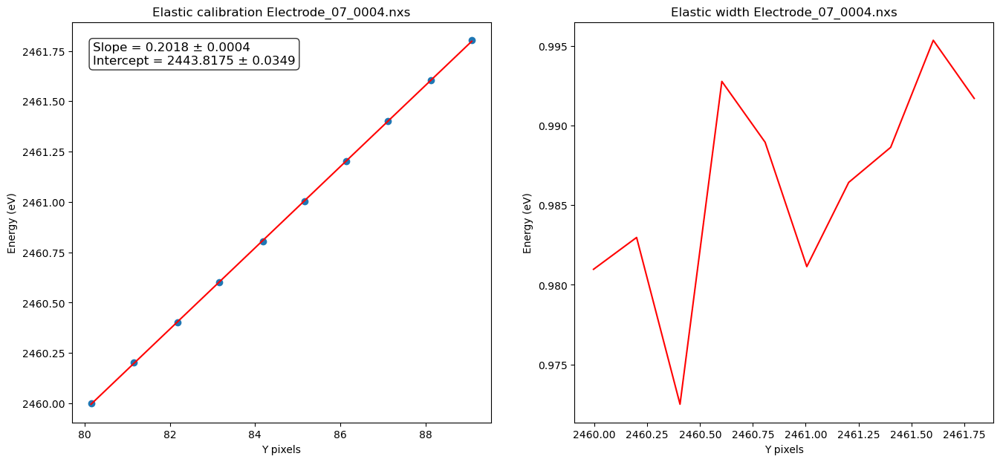

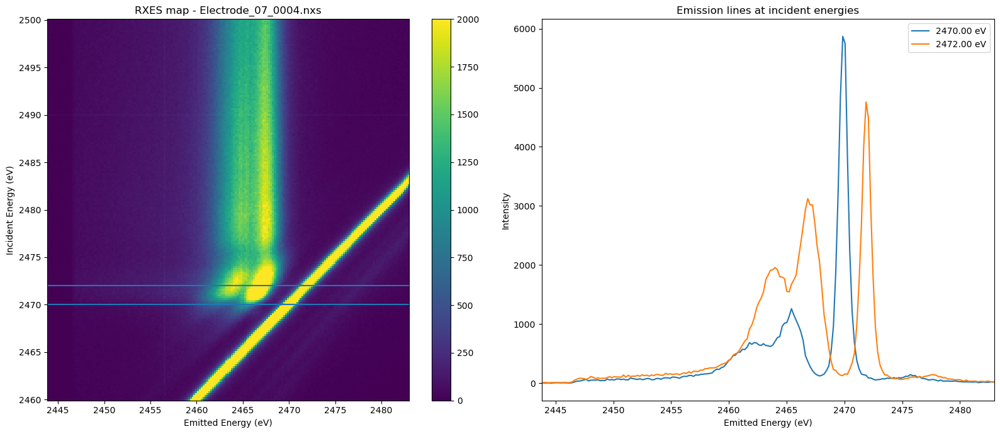

In [28]:
plot_line_XES('Electrode_07_0004.nxs', line, [315,345], [2470,2472], vmax = 2000)

In [29]:
# Electrode 08

In [30]:
plot_2Dmap('Electrode_08_0002.nxs', pixel_calibration, [315, 345], vmax_sum=5000)

In [31]:
line = energy_calibration('Electrode_08_0002.nxs', [315,320])

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

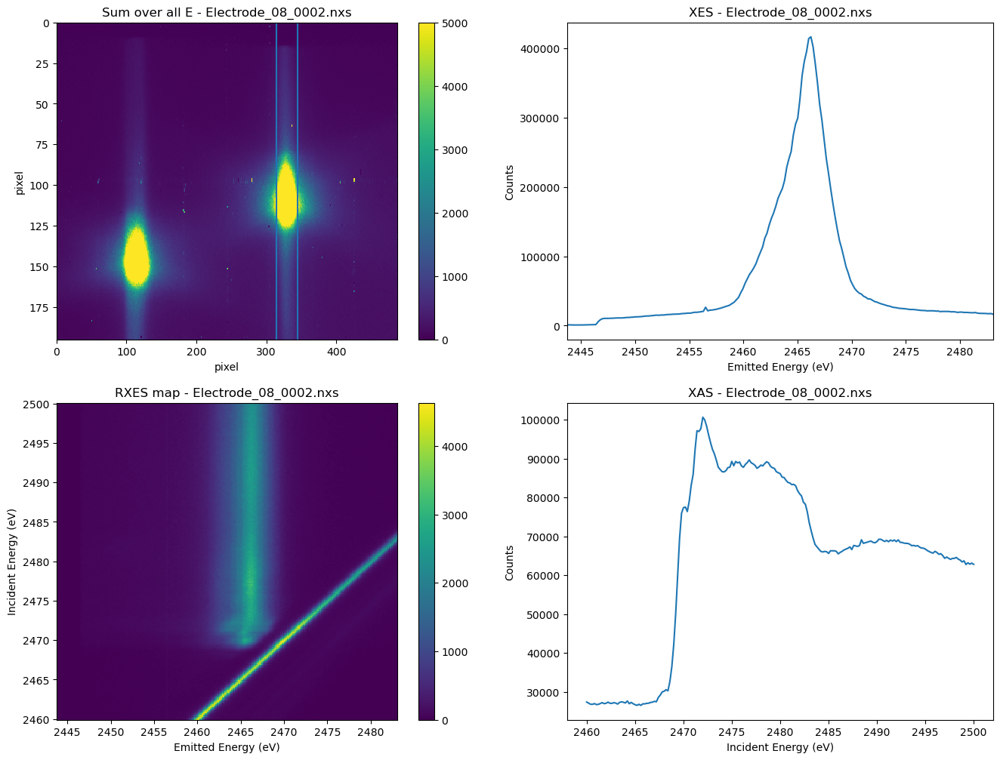

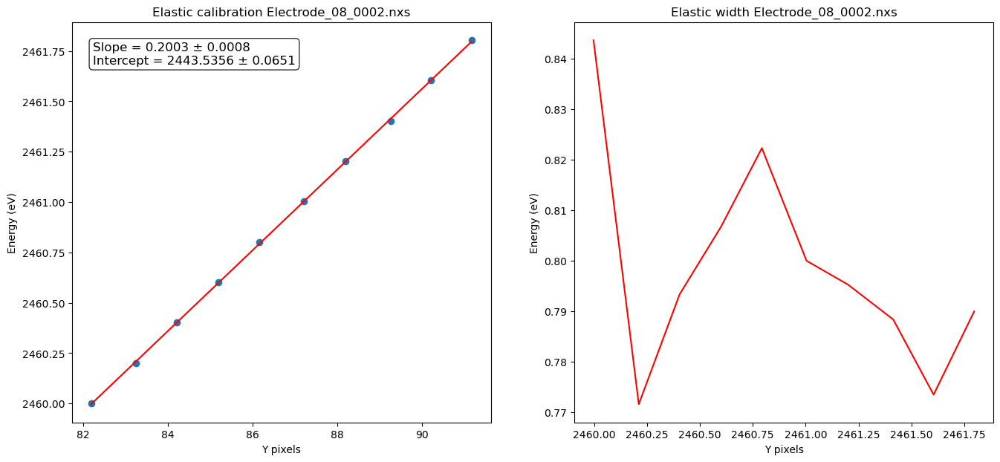

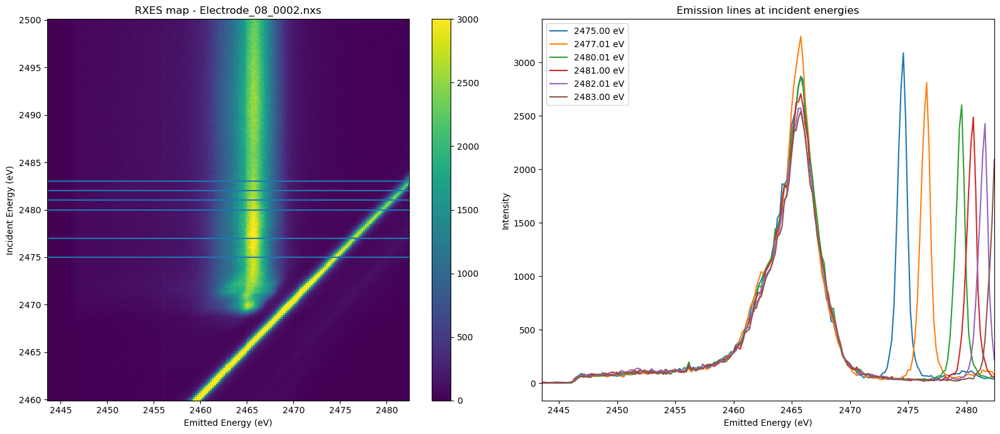

In [32]:
plot_line_XES('Electrode_08_0002.nxs', line, [315,345], [2475,2477, 2480,2481,2482,2483], vmax = 3000)

# Electrode 09


In [33]:
plot_2Dmap('Electrode_09_0002.nxs', pixel_calibration, [315, 345], vmax_sum=5000)

In [34]:
line = energy_calibration('Electrode_09_0002.nxs', [315,320])

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

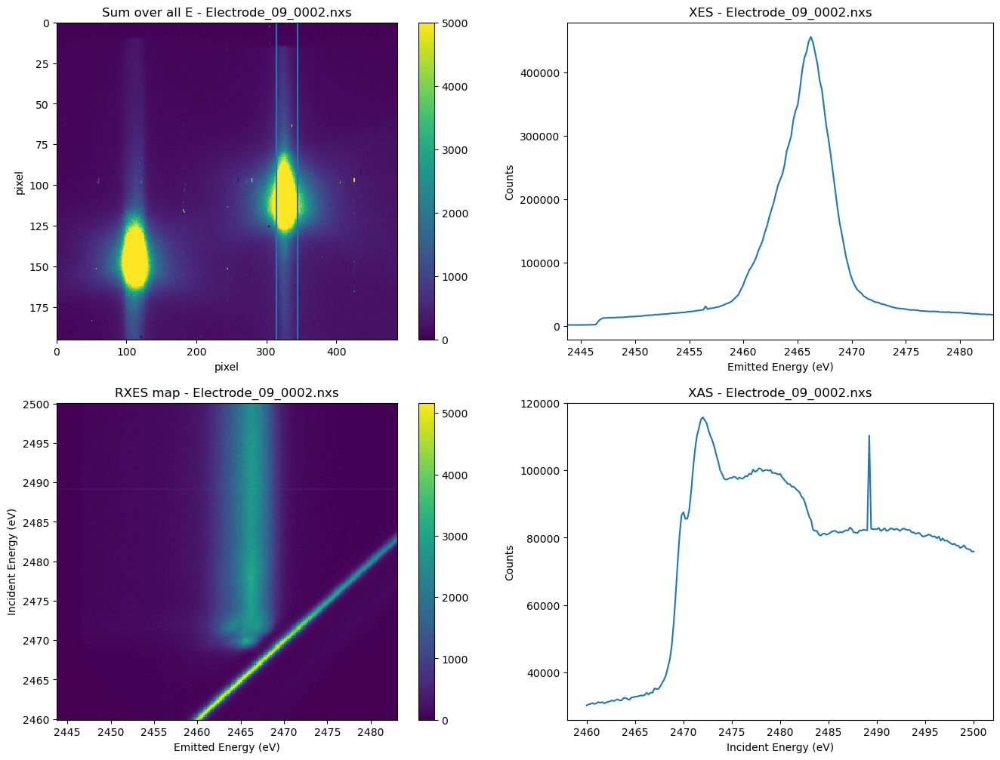

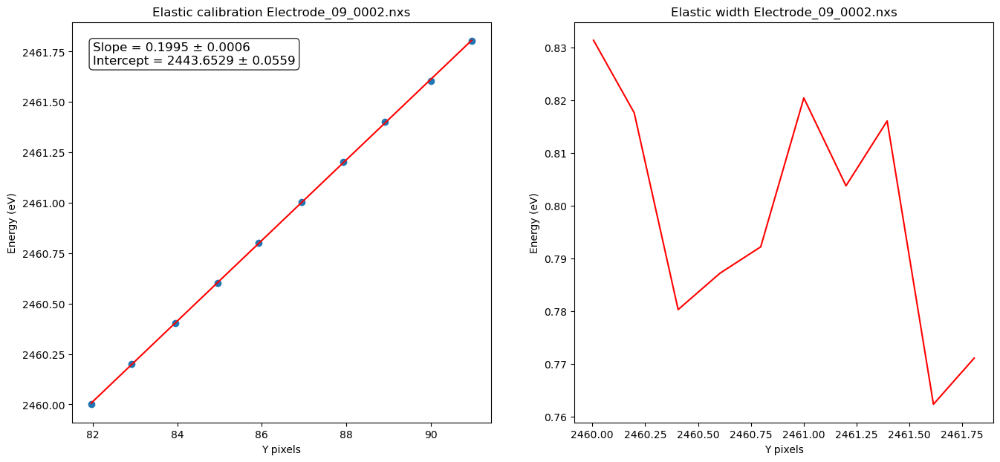

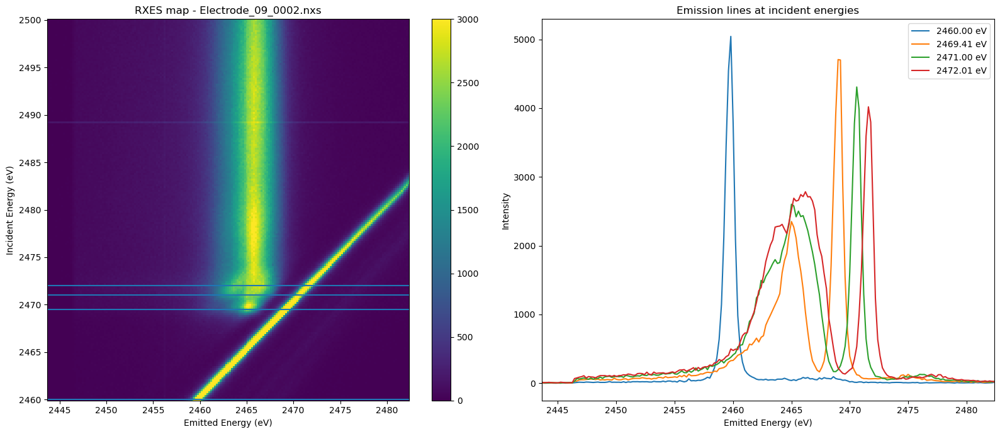

In [35]:
plot_line_XES('Electrode_09_0002.nxs', line, [315,345], [2460,2469.5,2471,2472], vmax = 3000)

# Electrode 10

In [36]:
plot_2Dmap('Electrode_10_0006.nxs', pixel_calibration, [290, 345], vmax_sum=5000)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

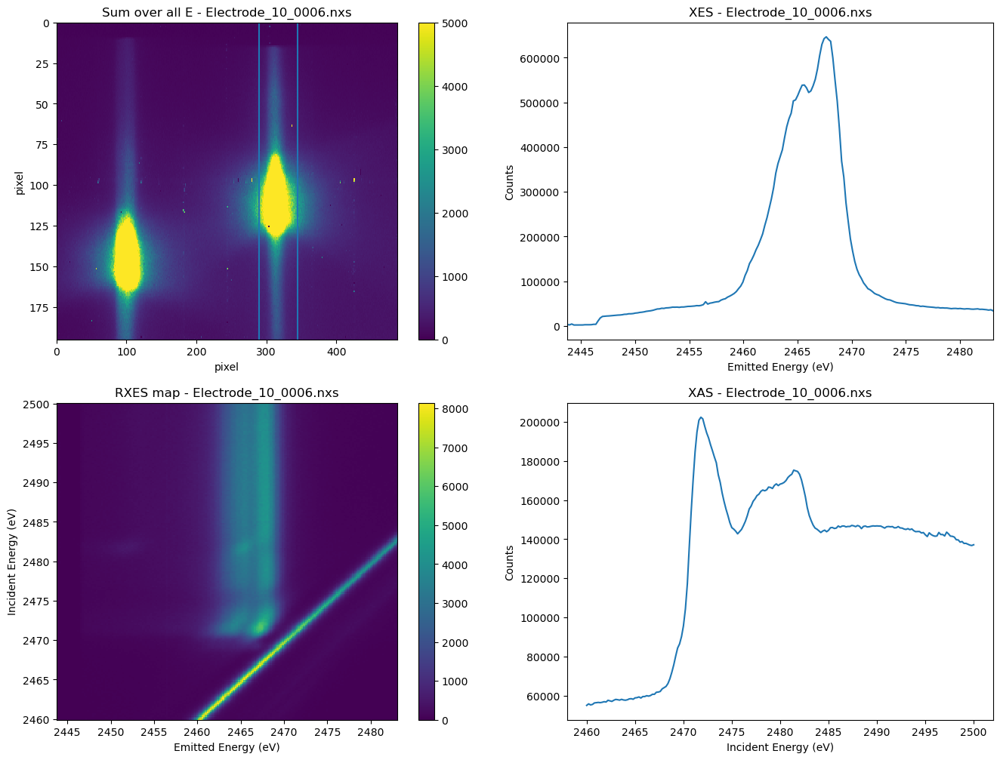

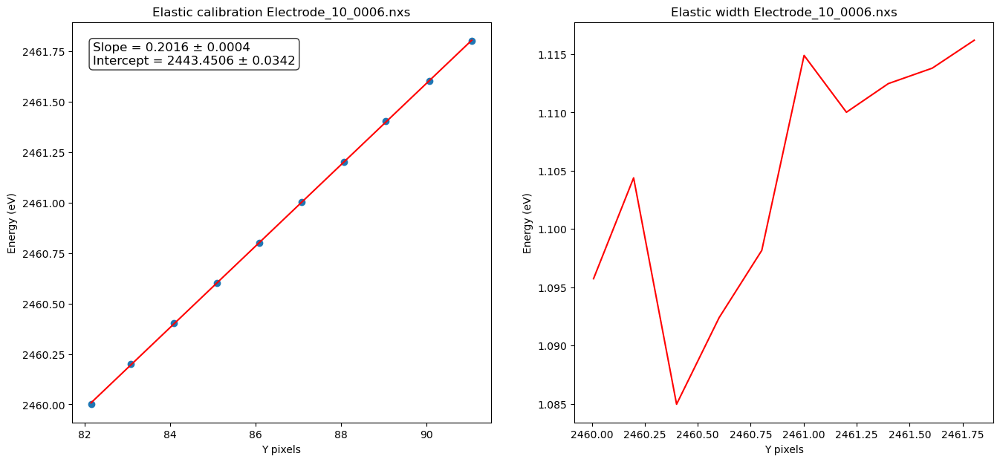

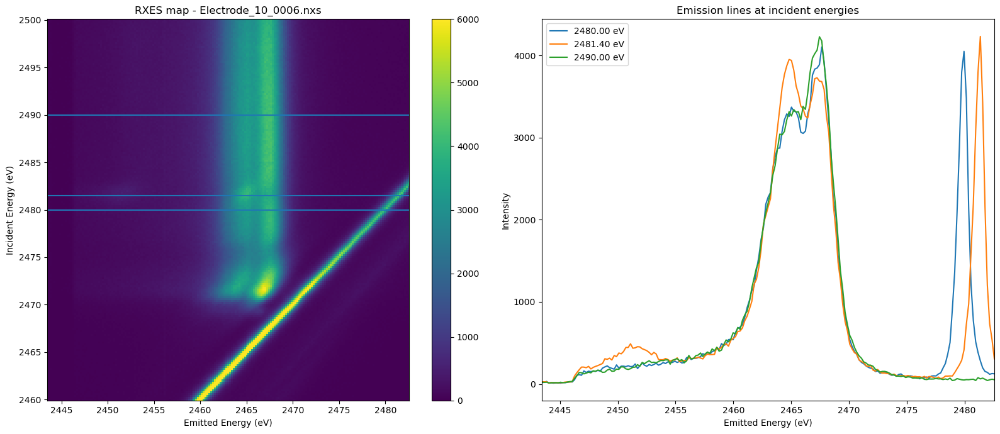

In [37]:
line = energy_calibration('Electrode_10_0006.nxs', [290, 345])
plot_line_XES('Electrode_10_0006.nxs', line, [290, 345], [2480,2481.5,2490], vmax = 6000)

# Electrode 12

In [38]:
plot_2Dmap('Electrode_12_0005.nxs', pixel_calibration, [290, 345], vmax_sum=5000)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

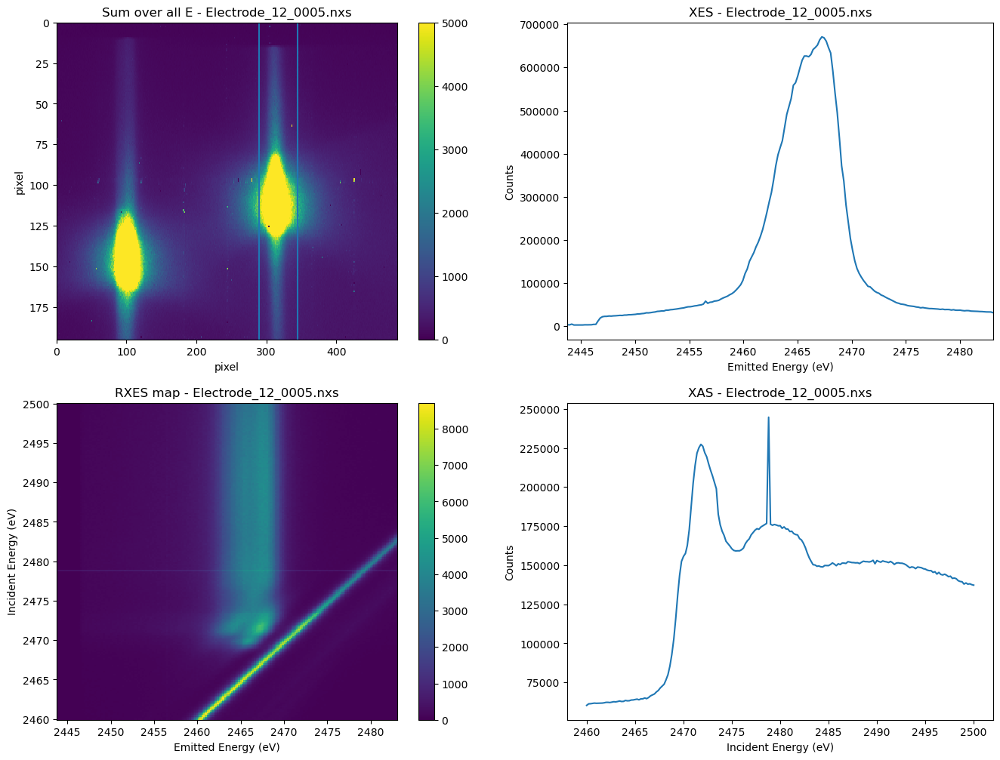

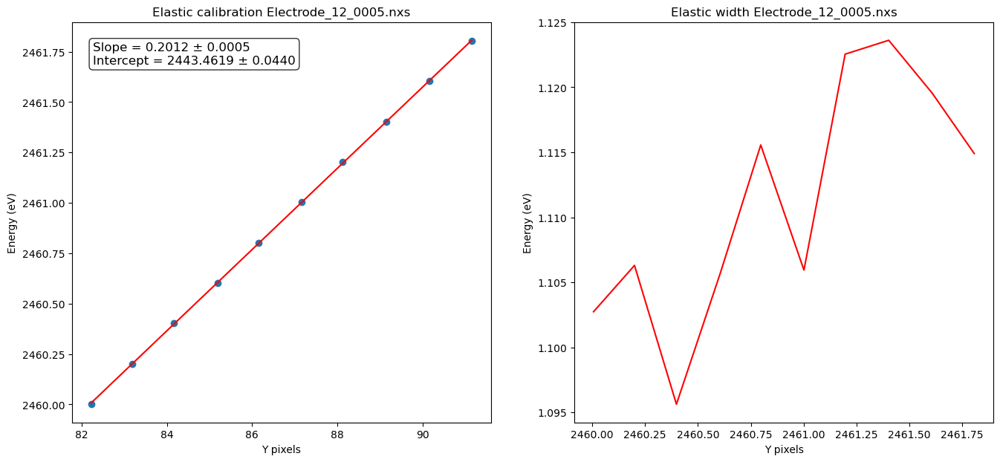

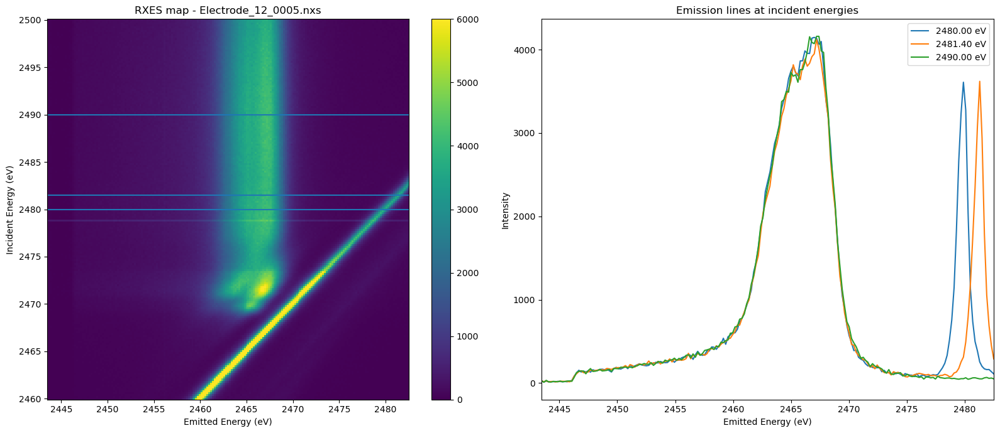

array([2.01237476e-01, 2.44346186e+03])

In [39]:
line = energy_calibration('Electrode_12_0005.nxs', [290, 345])
plot_line_XES('Electrode_12_0005.nxs', line, [290, 345], [2480,2481.5,2490], vmax = 6000)
line 

In [40]:
make_sample('Electrode_12_0006.nxs', [[220,240]])

# Electrode 13


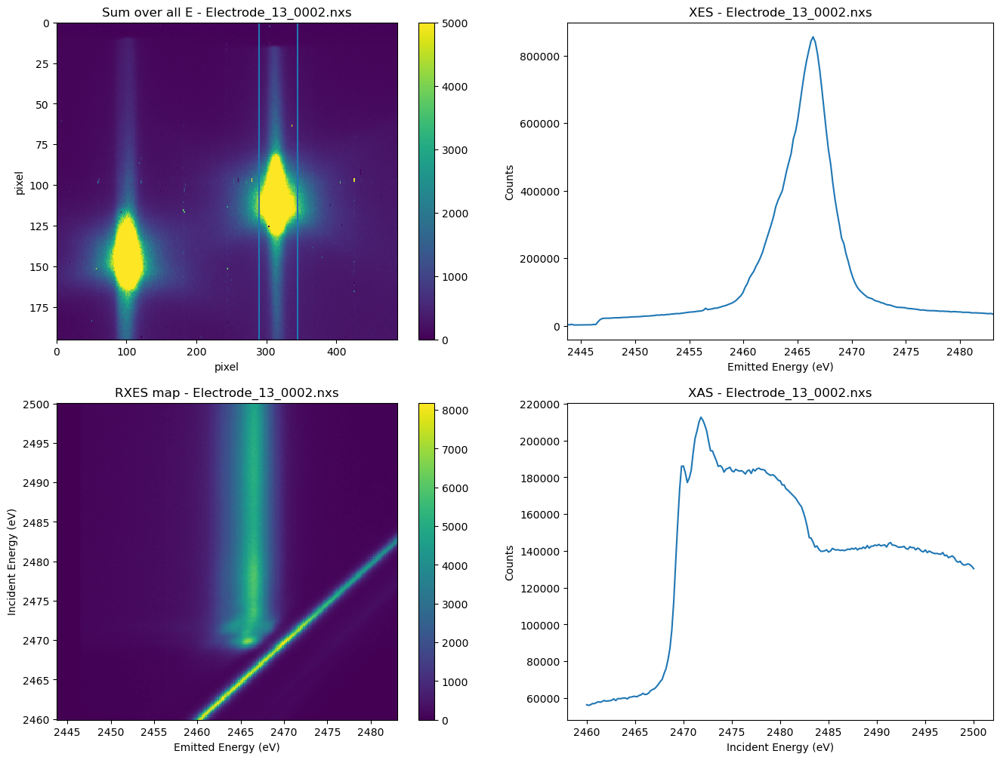

In [10]:
plot_2Dmap('Electrode_13_0002.nxs', pixel_calibration, [290, 345], vmax_sum=5000)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


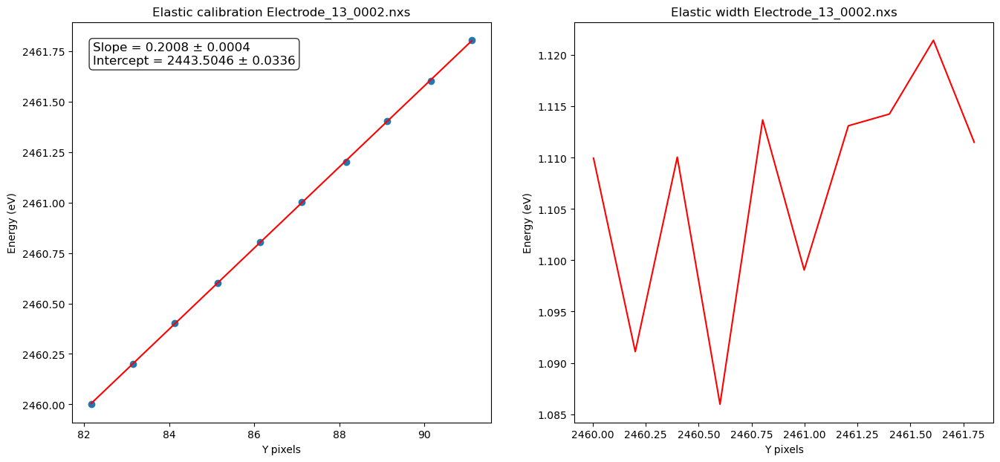

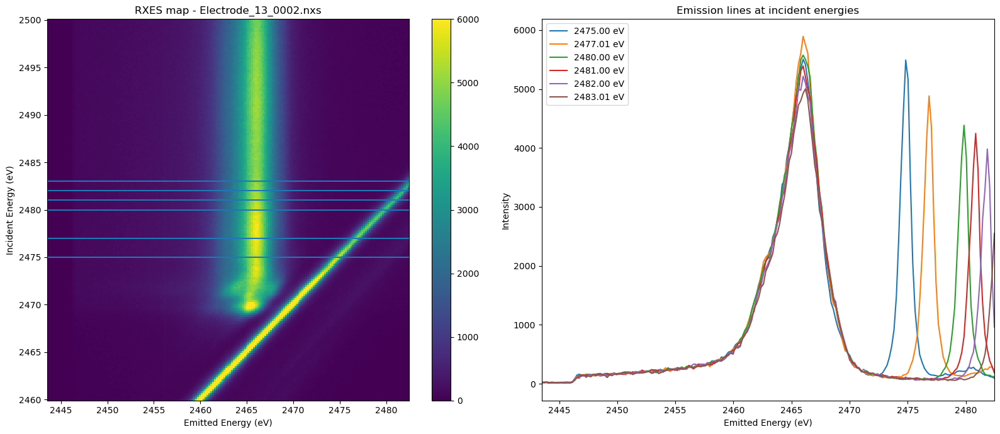

array([2.00806854e-01, 2.44350464e+03])

In [11]:
line = energy_calibration('Electrode_13_0002.nxs', [290, 345])
plot_line_XES('Electrode_13_0002.nxs', line, [290, 345], [2475,2477, 2480,2481,2482,2483], vmax = 6000)
line 

In [9]:
remove_elastic('Electrode_13_0002.nxs', line, [290, 345])

NameError: name 'line' is not defined

# Electrode 14

In [44]:
plot_2Dmap('Electrode_14_0002.nxs', pixel_calibration, [300, 345], vmax_sum=6000, vmax_rxes=6000,
           replace={'energies': np.arange(2460, 2500.1, 0.2)})

# Electrode 15

In [45]:
plot_2Dmap('Electrode_15_0003.nxs', pixel_calibration, [300, 345], vmax_sum=6000, vmax_rxes=6000,
           replace={'energies': np.arange(2460, 2500.1, 0.2)})

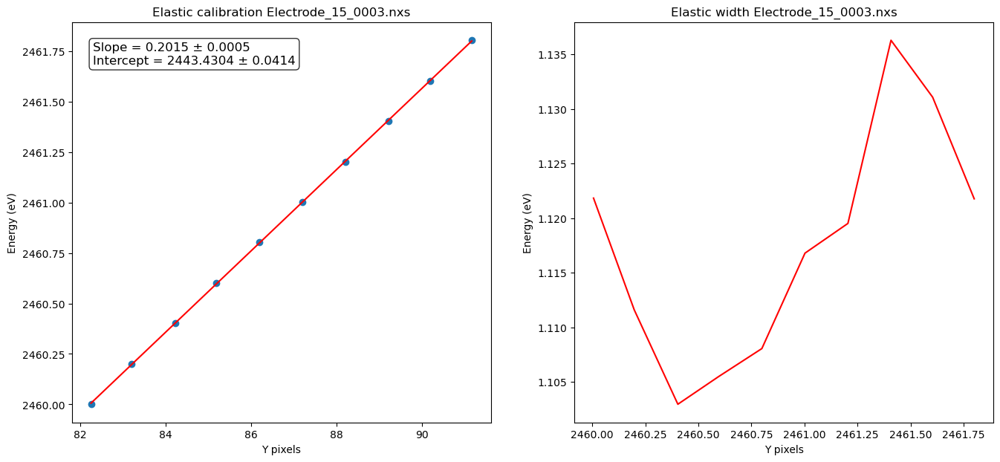

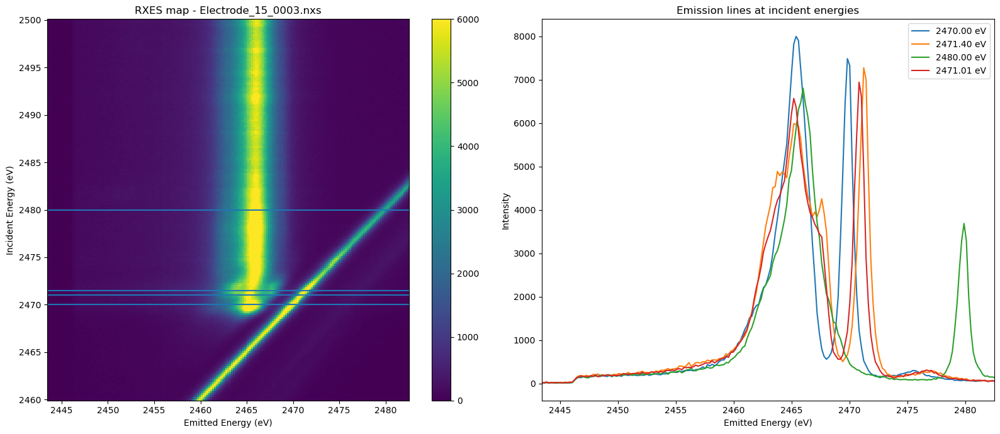

In [12]:
line = energy_calibration('Electrode_15_0003.nxs', [290, 345])
plot_line_XES('Electrode_15_0003.nxs', line, [290, 345], [2470,2471.5,2480,2471], vmax = 6000)

In [47]:
remove_elastic('Electrode_15_0003.nxs', line, [290, 345])

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

In [48]:
plot_2Dmap('Electrode_18_0038.nxs', pixel_calibration, [300, 345], vmax_sum=6000, vmax_rxes=6000)

/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/envs/mosarix/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
/home/ava/anaconda3/

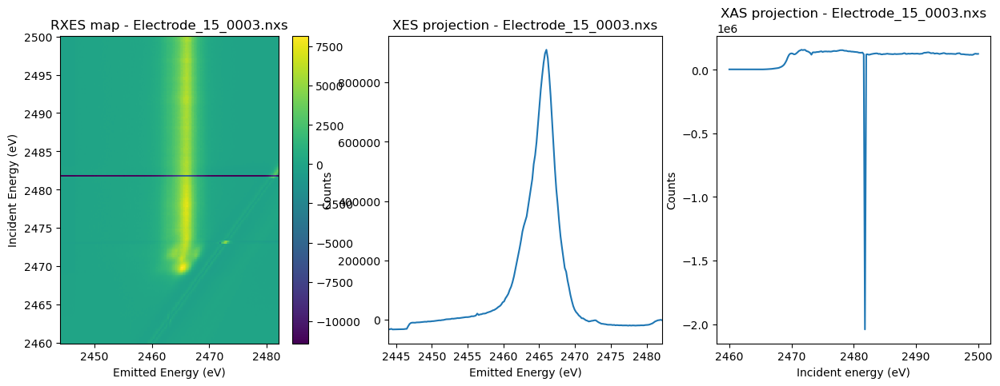

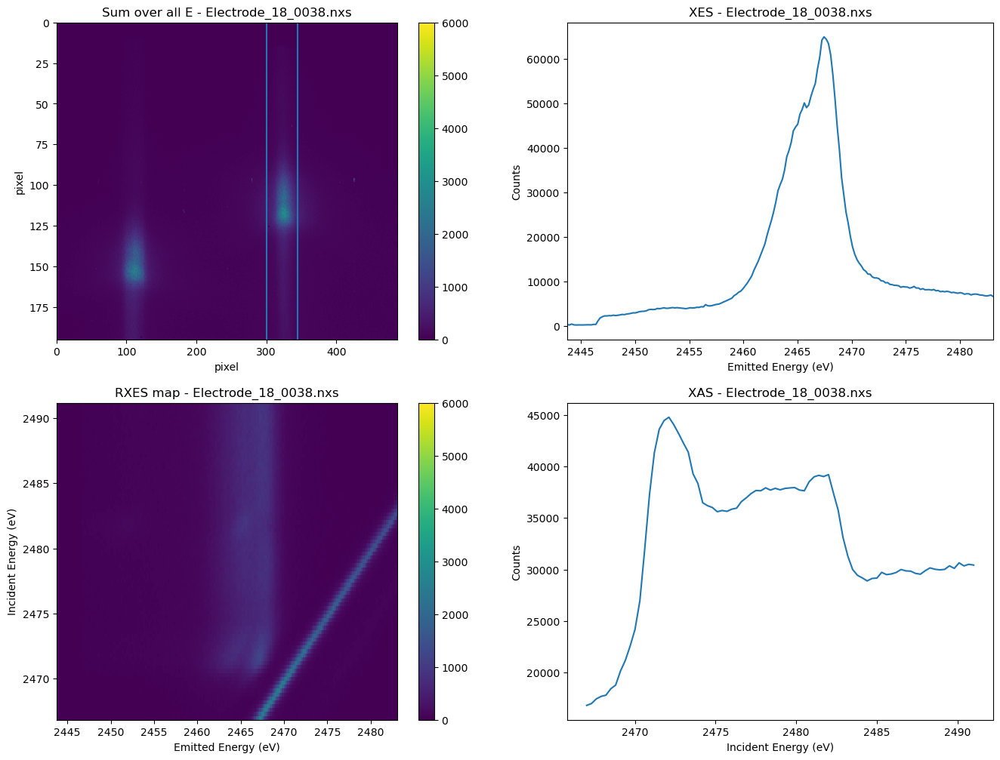

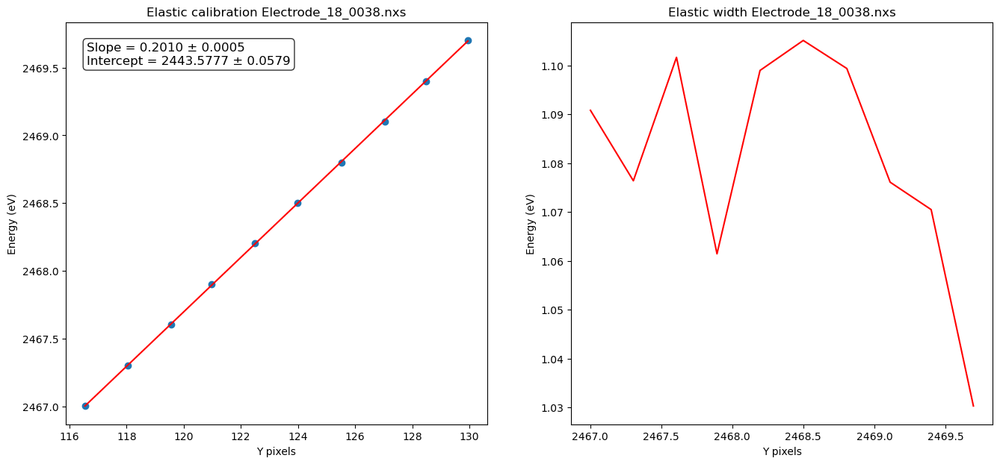

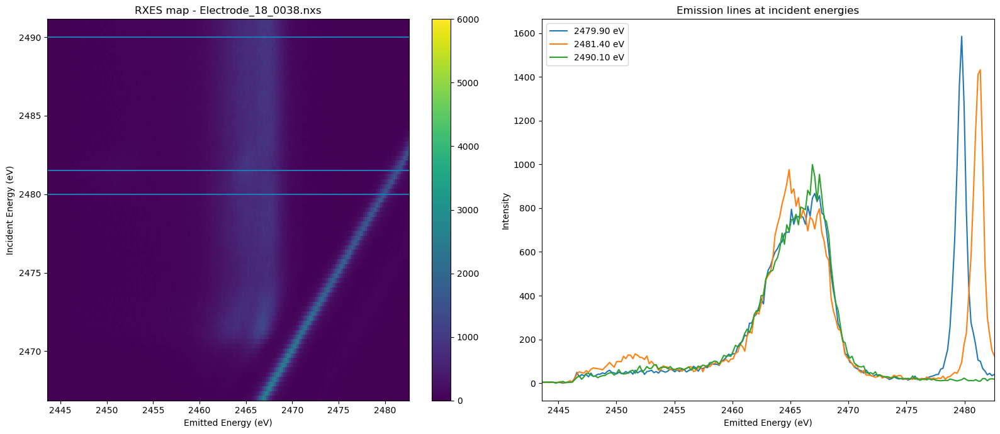

In [49]:
line = energy_calibration('Electrode_18_0038.nxs', [290, 345])
plot_line_XES('Electrode_18_0038.nxs', line, [290, 345], [2480,2481.5,2490], vmax = 6000)

# Electrode 21


In [50]:
plot_2Dmap('Electrode_22_0088.nxs', pixel_calibration, [300, 335], vmax_sum=100, vmax_rxes=100,
           replace={'energies': [2520]})

In [51]:
make_sample('Electrode_22_0089.nxs', [[220,240]])

# electrode 23

In [52]:
plot_2Dmap('Electrode_23_0113.nxs', pixel_calibration, [300, 335], vmax_sum=100, vmax_rxes=100,
           replace={'energies': [2520]})

# electrode 24


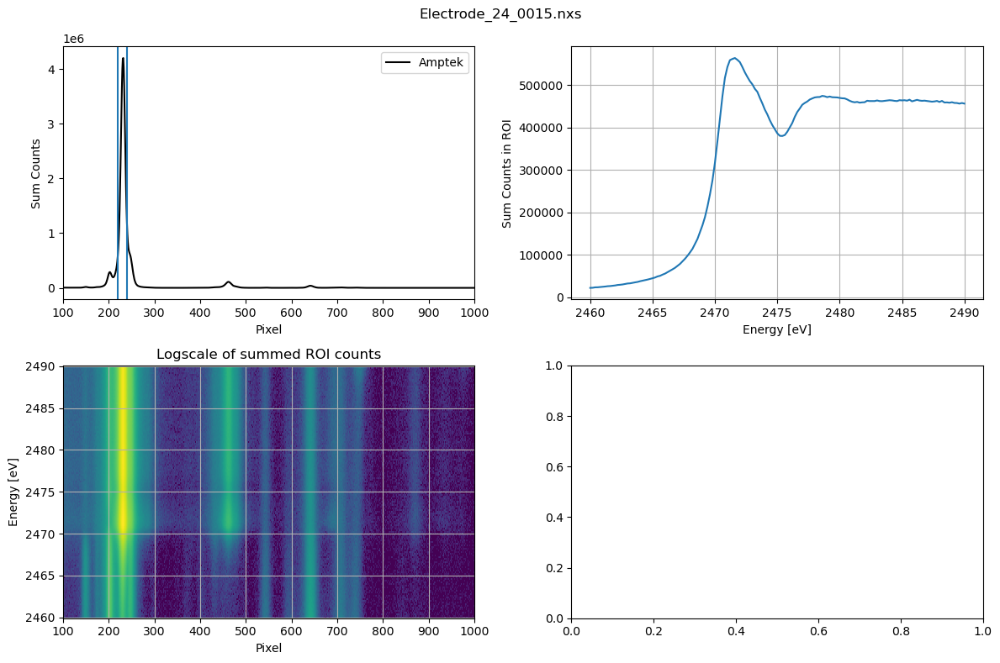

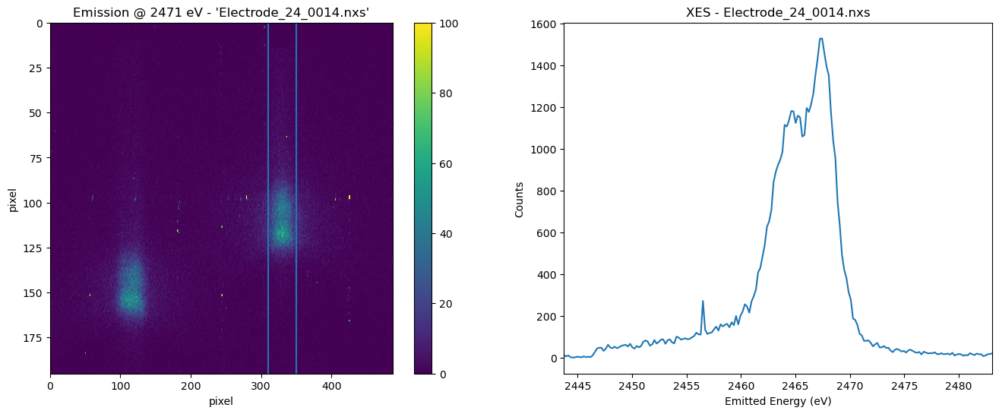

In [13]:

make_sample('Electrode_24_0015.nxs', [[220,240]])
plot_2Dmap('Electrode_24_0014.nxs', pixel_calibration, [310, 350], vmax_sum=100, vmax_rxes=100,
           replace={'energies': [2471.1, 2473.4, 2482.5, 2520.0,2520]})


In [54]:
def plot_multiple(): 
    avas_energies = [2471.1, 2473.4, 2482.5, 2520.0]


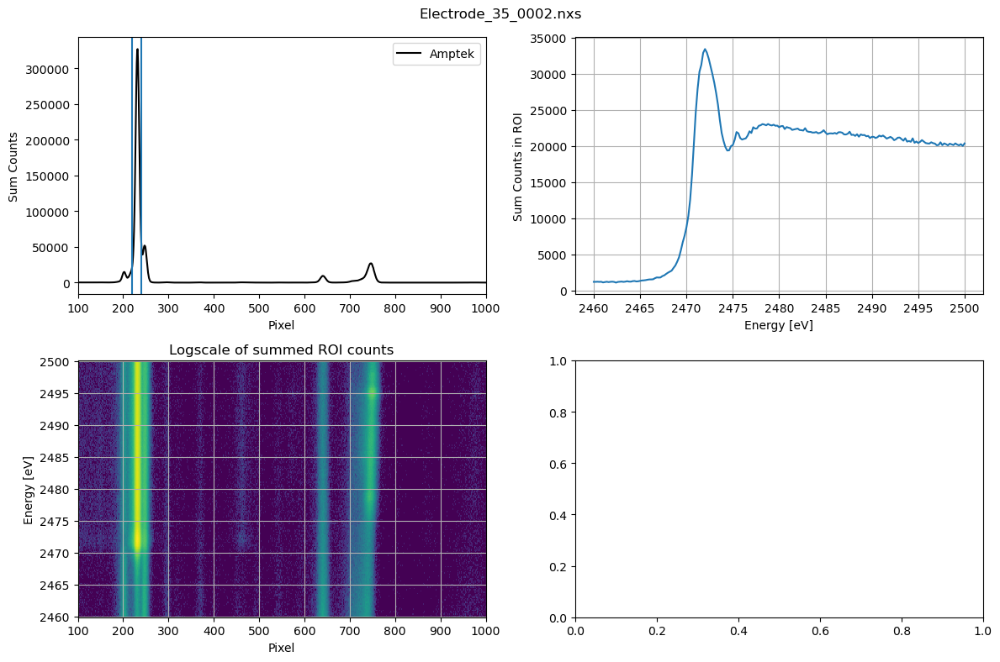

In [29]:
make_sample('Electrode_35_0002.nxs', [[220,240]])
